# CWT

In [171]:
from datetime import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from statsmodels.nonparametric.smoothers_lowess import lowess
from collections import defaultdict
import pywt
import scaleogram as scg
from ssqueezepy import cwt
from ssqueezepy.visuals import plot, imshow
from sklearn.metrics import mean_squared_error 

## ignore warnings
import warnings
warnings.filterwarnings('ignore')

# import the written functions
from CGMfunctions import *

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

from sklearn.utils.class_weight import compute_class_weight


### Tsalikian 2005 data
The purpose of this study was to find out how often low blood sugar (hypoglycemia) occurs during the night after exercise in late afternoon for children aged 10 to 18 with type 1 diabetes. The total sample size was 50 participants. The OneTouch Ultra Meter was used to continuously monitor glucose levels during two seperate 24 hours periods. <br>
Sample size: 50 <br>
Diabetes Type: Type 1 <br>
Population Group: Children (10-18) <br>
CGM device: OneTouch Ultra Meter <br>
Duration: 48 hours, every 5 minutes <br> 


In [3]:
tsalikian2005 = pd.read_csv("./data/Tsalikian2005_processed.csv",header = 0,index_col=False)  
tsalikian2005.rename(columns = {'gl': 'Glucose','time':'Time'},inplace = True)
tsalikian2005.id.unique()

array([ 7, 43,  2, 27, 38, 15, 16, 19, 22, 32, 11,  8, 20, 44, 35, 18, 42,
       17, 36, 46, 33, 48,  5, 53, 14, 40, 13, 41, 25, 26, 28,  3, 50, 29,
       24, 12,  9, 23,  1, 10, 54, 39,  4, 37, 31, 30,  6, 52, 21, 45],
      dtype=int64)

In [2]:
Anderson2016 = pd.read_csv("./data/Anderson2016_processed.csv",header = 0,index_col=False)  
Anderson2016.rename(columns = {'gl': 'Glucose','time':'Time'},inplace = True)
Anderson2016.head(3)

,id,Time,Glucose
0,1,2013-09-29 17:36:48,194
1,1,2013-09-29 17:41:48,204
2,1,2013-09-29 17:46:48,201


Split data into daily data

In [4]:
dfs_good = data_subject_info(tsalikian2005)
allsub_daily_dict = split_by_date_allsub(dfs_good)

There are in total  50 subjects.
The information for subject:  1
There are missing values in the dataset:
- Time: 24 missing values
Missing time range is  [(168, 179), (24626, 24637)]
Records per day:
          Date  Number of Records
0   2000-04-01                288
1   2000-04-02                144
2   2000-04-07                298
3   2000-04-08                174
4   2013-09-29                 77
..         ...                ...
93  2014-02-22                 28
94  2014-02-23                287
95  2014-02-24                279
96  2014-02-25                285
97  2014-02-26                 96

[98 rows x 2 columns]

Total number of days: 98
The information for subject:  2
There are no missing values in the dataset.
Records per day:
           Date  Number of Records
0    2000-02-06                212
1    2000-02-07                146
2    2000-02-15                298
3    2000-02-16                194
4    2013-08-26                 23
..          ...                ...
247 

Select the data with dates more than 250 records per day after cleaning the data and keep subject as the key of dict <br>
Ready to use data

In [5]:
allsub_daily_144_dict = filter_dfdict_by_record_count(allsub_daily_dict,144) 
print(len(allsub_daily_144_dict))
allsub_chunk_dict = split_crossover_timechunk(allsub_daily_144_dict)
allsub_chunk_dict2 = remove_dup_dicts(allsub_chunk_dict)
allsub_6hours_dict = split_into_6hour_dict(allsub_chunk_dict2)
allsub_6hour_combined = combine_3keys(allsub_6hours_dict)
allsub_6hour_72_combined = filter_6hourdict_by_record_count(allsub_6hour_combined,72)
allsub_6hour_2keydict = split_combined_3keys(allsub_6hour_72_combined)

1321


In [22]:
test1 = filter_6hourdict_by_record_count(allsub_6hour_combined,70)
print(len(test1))

1388


In [90]:
def print_all_keys(df_dicts):
    multiple_chunk = []
    for date, date_dfs in df_dicts.items():
        print(f"Date: {date}")
        for subject in date_dfs.keys():
            print(f"  Subject: {subject}")
            parts = subject.split('_')  # Split subject by underscore
            if len(parts) >= 3 and (parts[-1] == '2' or parts[-1].startswith('2-')):
                multiple_chunk.append(subject)
            elif len(parts) >= 3 and (parts[-2] == '2' or parts[-2].startswith('2-')):
                multiple_chunk.append(subject)
    return multiple_chunk
chunks = print_all_keys(allsub_6hour_2keydict)
#print(len(chunks))

Date: 2000-04-01
  Subject: 2000-04-01_1_12:00-17:59
  Subject: 2000-04-01_1_18:00-23:59
  Subject: 2000-04-01_1_2_12:00-17:59
  Subject: 2000-04-01_1_2_18:00-23:59
  Subject: 2000-04-01_8_00:00-05:59
  Subject: 2000-04-01_8_2_00:00-05:59
  Subject: 2000-04-01_24_12:00-17:59
  Subject: 2000-04-01_24_18:00-23:59
  Subject: 2000-04-01_24_2_12:00-17:59
  Subject: 2000-04-01_24_2_18:00-23:59
  Subject: 2000-04-01_41_00:00-05:59
  Subject: 2000-04-01_41_2_00:00-05:59
  Subject: 2000-04-01_42_00:00-05:59
  Subject: 2000-04-01_42_2_00:00-05:59
Date: 2000-04-02
  Subject: 2000-04-02_12_12:00-17:59
  Subject: 2000-04-02_12_18:00-23:59
  Subject: 2000-04-02_12_2_12:00-17:59
  Subject: 2000-04-02_12_2_18:00-23:59
  Subject: 2000-04-02_26_12:00-17:59
  Subject: 2000-04-02_26_18:00-23:59
  Subject: 2000-04-02_26_2_12:00-17:59
  Subject: 2000-04-02_26_2_18:00-23:59
  Subject: 2000-04-02_32_12:00-17:59
  Subject: 2000-04-02_32_18:00-23:59
  Subject: 2000-04-02_32_2_12:00-17:59
  Subject: 2000-04-02_3

Do DWT on all the data

In [6]:
wavelet_candidates = ['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7',
                          'bior3.9', 'bior4.4','coif2','coif10', 'coif16','db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11',
                          'db12', 'db15', 'db25',  'haar', 'rbio1.5', 'rbio3.1', 'rbio6.8']
level_candidates = [2,3,4]

In [26]:
w = pywt.Wavelet('bior3.9')
print(pywt.dwt_max_level(data_len=72, filter_len=w.dec_len))

1


In [65]:
all_param_daily_df,all_param_daily_dict = get_best_parameters_allsubject_alldates(allsub_6hour_72_combined,wavelet_candidates,level_candidates)

In [187]:
# calculate metrics for all data samples
mse,psnr,snr,r_2 = [],[],[],[]
for key, df in all_param_daily_dict.items():
    
    mse.append(df['Value'][0])
    psnr.append(df['Value'][1])
    snr.append(df['Value'][2])
    r_2.append(df['Value'][3])


In [200]:
import math
print(np.max(r_2))
print(np.mean(mse),np.mean(psnr[psnr != math.inf]),np.mean(snr[snr!= math.inf]),np.mean(r_2[r_2!= -math.inf]))

1.0
0.5625735364750093 43.59529409465138 40.548491787589484 0.9960964095673086


Get all the reconstructed signals after DWT

In [44]:
denoised_signal_dict = denoised_cgm_allsub_daily(allsub_6hour_2keydict,all_param_daily_df)

### save and reload denoised parameters

In [45]:
# save data
import pickle
with open('denoised_tsalikian_signal_dict.pkl', 'wb') as fp:
    pickle.dump(denoised_signal_dict, fp)
    print('dictionary saved successfully to file')

dictionary saved successfully to file


In [9]:
# reload data
import pickle
with open('denoised_tsalikian_signal_dict.pkl', 'rb') as fp:
    denoised_signal_dict = pickle.load(fp)
    print(denoised_signal_dict)

{'2000-04-01': {'2000-04-01_1_12:00-17:59': array([ 92.66021507,  98.6405192 , 105.96445315, 115.58666863,
       128.53718748, 143.8227312 , 161.05955137, 179.22232501,
       196.43014774, 213.21541394, 231.51659723, 251.88450002,
       274.62942992, 300.25073048, 320.64135986, 304.04685635,
       285.89797707, 272.30504482, 253.48290626, 246.49729948,
       234.22222469, 220.55784193, 211.59089039, 205.92171589,
       202.90867016, 201.80514918, 197.66495013, 186.67100593,
       171.35010844, 169.53667158, 158.41384959, 154.78513265,
       152.18188278, 156.32854324, 167.35745238, 159.26617799,
       143.55628764, 141.31997523, 149.34872451, 145.96375493,
       158.70836914, 168.92339638, 169.78123976, 169.03642061,
       166.32832221, 163.97646991, 160.97391128, 157.07715796,
       151.08686117, 145.17152508, 143.38981512, 143.40379371,
       140.86665285, 137.48714108, 135.89235539, 133.98147261,
       129.68251817, 124.47162536, 120.15922805, 117.27616584,
       116.

### Get the labels, 1 if less than 70, 0 if not 

In [31]:
# for date, subjects_dict in allsub_6hour_2keydict.items():
#     for subject, df in subjects_dict.items():
#         print(subject,date)

In [202]:
allsub_6hour_2keydict_labels = label_glucose(allsub_6hour_2keydict) 
original_label_df = label_summary_df(allsub_6hour_2keydict_labels)
original_label_df.head(3)
original_label_df['timesegment'] = original_label_df['subject'].apply(lambda x: x.split('_')[-1])
summary = original_label_df.groupby('timesegment')['Label'].sum().reset_index()
summary

,timesegment,Label
0,00:00-05:59,432
1,06:00-11:59,339
2,12:00-17:59,583
3,18:00-23:59,597


In [209]:
test = original_label_df.copy()
test['subject'] = original_label_df['subject'].apply(lambda x: x.split('_')[1])
test.groupby('subject').count()#['Label'].sum().reset_index()

,date,Label,timesegment
subject,,,
1,151,151,151
10,386,386,386
11,623,623,623
12,120,120,120
13,342,342,342
14,534,534,534
15,573,573,573
16,286,286,286
17,485,485,485


In [12]:
print(sum(original_label_df['Label']))
print(len(allsub_6hour_72_combined))
#print(sum(denoised_label_df['Label']))

1951
9513


In [13]:
denoised_signal_dict_labels = label_denoised_glucose(denoised_signal_dict)
denoised_label_df = label_summary_df(denoised_signal_dict_labels)
sum(denoised_label_df['Label'])
denoised_label_df['timesegment'] = denoised_label_df['subject'].apply(lambda x: x.split('_')[-1])
summary = denoised_label_df.groupby('timesegment')['Label'].sum().reset_index()
summary

,timesegment,Label
0,00:00-05:59,441
1,06:00-11:59,350
2,12:00-17:59,606
3,18:00-23:59,615


## Calculate Metrics 

In [42]:
def metricdf_by_timesegment(allsub_6hour_2keydict,denoised_signal_dict,org_dict_labels,denoised_dict_labels):
    subjects = []
    mse_values = []
    psnr_values = []
    snr_values = []
    org_labels = []
    denoise_labels = []
    for date, dict in allsub_6hour_2keydict.items():
        for subject, df in dict.items():
            mse_1= get_metrics(df['Glucose'],denoised_signal_dict[date][subject])['MSE'].values 
            psnr_1= get_metrics(df['Glucose'],denoised_signal_dict[date][subject])['PSNR'].values
            snr_1= get_metrics(df['Glucose'],denoised_signal_dict[date][subject])['SNR'].values
            subjects.append(subject)
            mse_values.append(np.round(mse_1,6))
            psnr_values.append(np.round(psnr_1,6))
            snr_values.append(np.round(snr_1,6))
            org_labels.append(org_dict_labels[date][subject]['Label'][0])
            denoise_labels.append(denoised_dict_labels[date][subject]['Label'][0])

    result_df = pd.DataFrame({
        'subject': subjects,
        'MSE_values': mse_values,
        'PSNR_values': psnr_values,
        'SNR_values': snr_values,
        'org_label':org_labels,
        'denoise_label':denoise_labels
    })        
    return result_df

def summarydf_timesegment(df):
    df['time_segment'] = df['subject'].apply(lambda x: x.split('_')[-1])
    result = df.groupby(['time_segment','denoise_label']).agg( mean_MSE=('MSE_values', 'mean'), mean_PSNR=('PSNR_values', 'mean'), mean_SNR=('SNR_values', 'mean'),
                                                              count=('MSE_values', 'size')).reset_index() #,
                                            
    result2 = df.groupby(['time_segment']).agg(mean_MSE=('MSE_values', 'mean'), mean_PSNR=('PSNR_values', 'mean'), mean_SNR=('SNR_values', 'mean'),
                                               org_1s = ('org_label','sum'), denoise_1s = ('denoise_label','sum'), count=('MSE_values', 'size')).reset_index()
    return result, result2

In [14]:
metricdf_6hour = metricdf_by_timesegment(allsub_6hour_2keydict,denoised_signal_dict,allsub_6hour_2keydict_labels,denoised_signal_dict_labels)
summarydf_6hour,summarydf_6hour2 = summarydf_timesegment(metricdf_6hour)
print(summarydf_6hour)
print(summarydf_6hour2)


  time_segment  denoise_label               mean_MSE             mean_PSNR  \
0  00:00-05:59              0    [0.325051757438017]                 [inf]   
1  00:00-05:59              1   [0.3607352868632709]   [53.21376770509382]   
2  06:00-11:59              0  [0.48751541616038785]   [50.99890648967204]   
3  06:00-11:59              1   [0.5282983342857142]   [49.63944545142862]   
4  12:00-17:59              0   [0.5766024869675774]   [50.75718380419587]   
5  12:00-17:59              1   [0.5593630901060074]   [50.81938348763254]   
6  18:00-23:59              0   [0.5963057717250331]   [51.08249611284043]   
7  18:00-23:59              1   [0.6097282771535582]  [49.822565470037475]   

               mean_SNR  count  
0                 [inf]   2420  
1   [49.86436659249329]    373  
2   [48.50239864337782]   1646  
3    [46.2306936114286]    350  
4   [48.23344858804829]   1573  
5  [47.372164759717315]    566  
6  [48.396725773022105]   1542  
7   [46.15877484269666]    534  


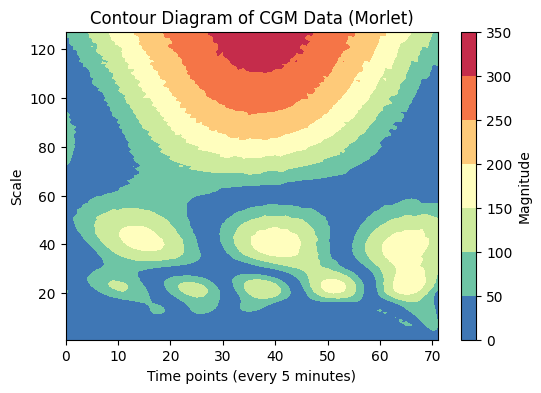

In [155]:
scales = np.arange(1, 128)
denoised_sig = denoised_signal_dict[try_date][key2]
coefficients, frequencies = pywt.cwt(denoised_sig, scales, 'morl') # cmor morl mexh # 10 is the sampling period, which is independent of computing coeffs.

power = (abs(coefficients)) ** 2

time = np.arange(0,len(denoised_sig))
fig, ax = plt.subplots(figsize=(6,4))

#plt.contourf(time, scales, np.log2(power), cmap='Spectral_r') #Spectral_r bone
plt.contourf(time, scales, np.abs(coefficients), cmap='Spectral_r') #Spectral_r bone
plt.colorbar(label='Magnitude')
plt.title('Contour Diagram of CGM Data (Morlet)')
plt.xlabel('Time points (every 5 minutes)')
plt.ylabel('Scale')
plt.ylim(min(scales), max(scales))  
#plt.gca().invert_yaxis()  # Invert y-axis to match typical scale representation
plt.show()

## try get CWT for all sub all dates

### try get CWT for all data

In [177]:
wavelet = 'morl'  # Complex Morlet wavelet 'mexh' 'gaus' 'cmor' 
scales = np.arange(1, 128)

In [178]:
coefficients_dict, frequencies_dict = get_cwt_allsub_daily(denoised_signal_dict,scales,wavelet)

In [45]:
# for date,dfs in allsub_daily_250_dict.items():
#     for subject,df in dfs.items():
#         print(date,subject)

In [99]:

key2 = '2014-06-14_19_18:00-23:59'
try_date =  key2.split('_')[0]
denoised_sig = denoised_signal_dict[try_date][key2]

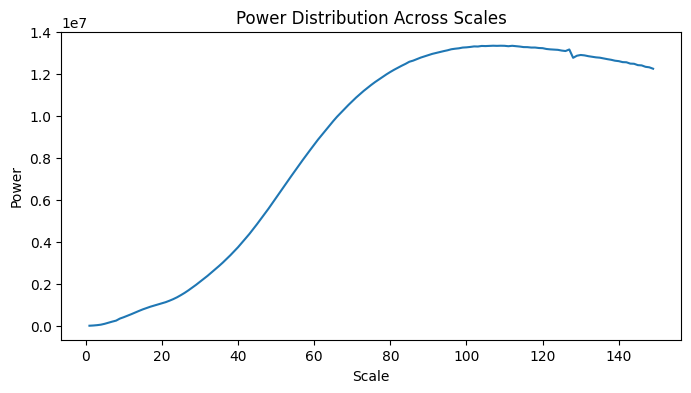

In [100]:
scales = np.arange(1, 150)
def compute_power_distribution(signal, scales, waveletname='mexh'):
    coefficients, frequencies = pywt.cwt(signal, scales, waveletname)
    power = np.sum(abs(coefficients) ** 2, axis=1)
    return power
energy_distribution = compute_power_distribution(denoised_sig,scales,'cmor')
plt.figure(figsize=(8, 4))
plt.plot(scales, energy_distribution)
plt.title('Power Distribution Across Scales')
plt.xlabel('Scale')
plt.ylabel('Power')
plt.show()


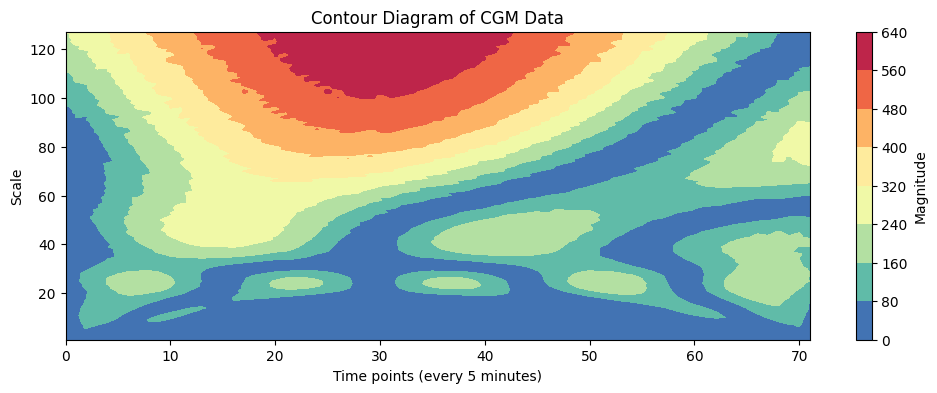

In [101]:
scales = np.arange(1, 128)
coefficients, frequencies = pywt.cwt(denoised_sig, scales, 'morl') # cmor morl mexh # 10 is the sampling period, which is independent of computing coeffs.

power = (abs(coefficients)) ** 2

time = np.arange(0,len(denoised_sig))
fig, ax = plt.subplots(figsize=(12,4))

#plt.contourf(time, scales, np.log2(power), cmap='Spectral_r') #Spectral_r bone
plt.contourf(time, scales, np.abs(coefficients), cmap='Spectral_r') #Spectral_r bone
plt.colorbar(label='Magnitude')
plt.title('Contour Diagram of CGM Data')
plt.xlabel('Time points (every 5 minutes)')
plt.ylabel('Scale')
plt.ylim(min(scales), max(scales))  
#plt.gca().invert_yaxis()  # Invert y-axis to match typical scale representation
plt.show()

In [185]:
#interactive_compare(allsub_6hour_2keydict[try_date][key2],denoised_signal_dict[try_date][key2])

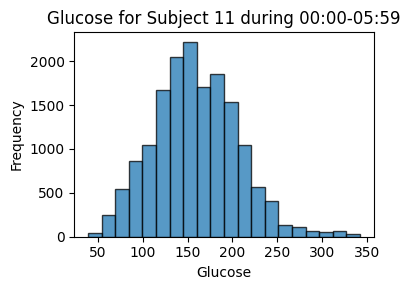

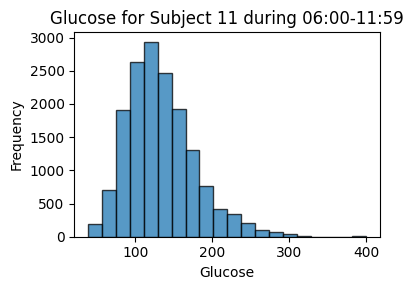

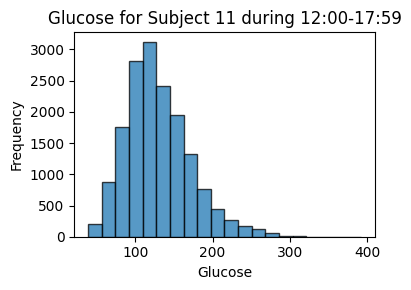

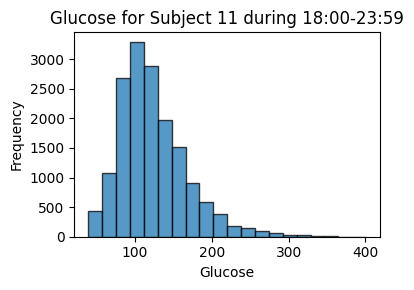

In [115]:
def plot_subject_glucose_histograms(data_dict, target_subject):
    glucose_values_by_segment = {}

    for date, subjects_dict in data_dict.items():
        if target_subject in subjects_dict:
            segments_dict = subjects_dict[target_subject]
            for segment, df in segments_dict.items():
                if segment not in glucose_values_by_segment:
                    glucose_values_by_segment[segment] = []
                glucose_values_by_segment[segment].extend(df['Glucose'].values)

    for segment, glucose_values in glucose_values_by_segment.items():
        plt.figure(figsize=(4, 3))
        plt.hist(glucose_values, bins=20, alpha=0.75, edgecolor='black')
        plt.title(f'Glucose for Subject {target_subject} during {segment}')
        plt.xlabel('Glucose')
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()



# CNN based 

### get all the coefficients

In [179]:
coeff_1key_dict = {}
for date, subjects_dict in coefficients_dict.items():
    for subject, data in subjects_dict.items():
        coeff_1key_dict[subject] = data
coeff_dataframes = list(coeff_1key_dict.values())
coeff_array = np.stack(coeff_dataframes, axis=0)
print(coeff_array.shape)


(9513, 127, 72)


In [180]:
net_input_data = np.zeros((coeff_array.shape[0], 128, 128, 3))
for i in range(coeff_array.shape[0]):
    input_for_densenet = prepare_input_net(coeff_array[i])
    net_input_data[i] = input_for_densenet

labels = denoised_label_df['Label'].values
labels = np.expand_dims(labels, axis=-1) 

## save net_input_data and reload

In [181]:
np.save('./data/net_input_data_tsalikian_denoised_morl.npy',net_input_data)
np.save('./data/labels_tsalikian_denoised_morl.npy',labels)

In [163]:
net_input_data = np.load('./data/net_input_data_tsalikian_denoised.npy')
labels = np.load('./data/labels_tsalikian_denoised.npy')

In [4]:
print(labels.shape)
print(net_input_data.shape)

(9004, 1)
(9004, 128, 128, 3)


## TRAIN/VAL/TEST/

In [182]:
x_train, x_temp, y_train, y_temp = train_test_split(net_input_data, labels, stratify = labels, test_size=0.3, random_state=10)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, stratify = y_temp, test_size=0.5, random_state=1)

In [183]:
y_train_weight =  np.concatenate(y_train).ravel().tolist()
class_weights = compute_class_weight(class_weight='balanced',classes = np.unique(y_train_weight), y =y_train_weight)
class_weights =  {0: class_weights[0], 1: class_weights[1]}
class_weights

{0: 0.6340697010093316, 1: 2.3647017045454546}

## ResNet

In [168]:
from keras.models import Model
from keras.callbacks import *
from keras.layers import Input, Dense, Flatten,Activation, BatchNormalization, Conv2D, Conv2DTranspose, MaxPooling2D, Add, AveragePooling2D
from keras.activations import *
#from keras.datasets import cifar,cifar10,cifar100
from keras.utils import to_categorical, plot_model
from keras.optimizers import *

In [166]:
cl_in      = Input(shape=x_train.shape[1:])
cl_conv_1  = Conv2D(64, 3, strides=2, activation='selu', padding='same', kernel_initializer='lecun_normal')(cl_in)
cl_pl_1    = MaxPooling2D()(cl_conv_1)
cl_res_1_1 = BatchNormalization()(cl_pl_1)
cl_res_1_1 = Activation('relu')(cl_res_1_1)
cl_res_1_1 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_1_1)
cl_res_1_2 = BatchNormalization()(cl_res_1_1)
cl_res_1_2 = Activation('relu')(cl_res_1_2)
cl_res_1_2 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_1_2)
cl_res_1_a = Add()([cl_pl_1, cl_res_1_2])
cl_res_2_1 = BatchNormalization()(cl_res_1_a)
cl_res_2_1 = Activation('relu')(cl_res_2_1)
cl_res_2_1 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_2_1)
cl_res_2_2 = BatchNormalization()(cl_res_2_1)
cl_res_2_2 = Activation('relu')(cl_res_2_2)
cl_res_2_2 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_2_2)
cl_res_2_a = Add()([cl_res_1_a, cl_res_2_2])
cl_res_3_1 = BatchNormalization()(cl_res_2_a)
cl_res_3_1 = Activation('relu')(cl_res_3_1)
cl_res_3_1 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_3_1)
cl_res_3_2 = BatchNormalization()(cl_res_3_1)
cl_res_3_2 = Activation('relu')(cl_res_3_2)
cl_res_3_2 = Conv2D(64, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_3_2)
cl_res_3_a = Add()([cl_res_2_a, cl_res_3_2])
cl_conv_2  = Conv2D(128, 3, strides=2, padding='same', kernel_initializer='lecun_normal')(cl_res_3_a)
cl_conv_2  = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_conv_2)
cl_res_4_1 = BatchNormalization()(cl_conv_2)
cl_res_4_1 = Activation('relu')(cl_res_4_1)
cl_res_4_1 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_4_1)
cl_res_4_2 = BatchNormalization()(cl_res_4_1)
cl_res_4_2 = Activation('relu')(cl_res_4_2)
cl_res_4_2 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_4_2)
cl_res_4_a = Add()([cl_conv_2, cl_res_4_2])
cl_res_5_1 = BatchNormalization()(cl_res_4_a)
cl_res_5_1 = Activation('relu')(cl_res_5_1)
cl_res_5_1 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_5_1)
cl_res_5_2 = BatchNormalization()(cl_res_5_1)
cl_res_5_2 = Activation('relu')(cl_res_5_2)
cl_res_5_2 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_5_2)
cl_res_5_a = Add()([cl_res_4_a, cl_res_5_2])
cl_res_6_1 = BatchNormalization()(cl_res_5_a)
cl_res_6_1 = Activation('relu')(cl_res_6_1)
cl_res_6_1 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_6_1)
cl_res_6_2 = BatchNormalization()(cl_res_6_1)
cl_res_6_2 = Activation('relu')(cl_res_6_2)
cl_res_6_2 = Conv2D(128, 3, strides=1, padding='same', kernel_initializer='lecun_normal')(cl_res_6_2)
cl_res_6_a = Add()([cl_res_5_a, cl_res_6_2])
cl_pl_2    = AveragePooling2D(pool_size=(2, 2))(cl_res_6_a)
cl_flatten = Flatten()(cl_pl_2)
cl_fc100   = Dense(2, activation='softmax')(cl_flatten)
classifier_ReLUBN = Model(cl_in, cl_fc100)
#plot_model(classifier_ReLUBN, 'resnet_ReLUBN.png', show_layer_names=False)
#classifier_ReLUBN.summary()

In [174]:
# x_train = x_train.astype('float32')
# x_test = x_test.astype('float32')
# x_val = x_val.astype('float32')
 
y_train = to_categorical(y_train, 2)
#y_test = keras.utils.to_categorical(y_test, num_classes)
y_val = to_categorical(y_val, 2)
epochs = 50
OPT = Adam(0.001)
classifier_ReLUBN.compile(loss='binary_crossentropy', optimizer=OPT, metrics=['binary_crossentropy', 'mse','acc'])
hist_classifier_ReLUBN_Res = classifier_ReLUBN.fit(x_train,y_train, batch_size=64, epochs=epochs, validation_data=(x_val, y_val))

Epoch 1/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - acc: 0.7469 - binary_crossentropy: 1.6588 - loss: 1.6588 - mse: 0.2303 - val_acc: 0.6952 - val_binary_crossentropy: 0.6738 - val_loss: 0.6738 - val_mse: 0.1889
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - acc: 0.8274 - binary_crossentropy: 0.4354 - loss: 0.4354 - mse: 0.1385 - val_acc: 0.7737 - val_binary_crossentropy: 0.5145 - val_loss: 0.5145 - val_mse: 0.1550
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 156s 1s/step - acc: 0.7817 - binary_crossentropy: 1.0797 - loss: 1.0797 - mse: 0.1881 - val_acc: 0.8073 - val_binary_crossentropy: 0.4305 - val_loss: 0.4305 - val_mse: 0.1397
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - acc: 0.8101 - binary_crossentropy: 0.4852 - loss: 0.4852 - mse: 0.1517 - val_acc: 0.7701 - val_binary_crossentropy: 0.4944 - val_loss: 0.4944 - val_mse: 0.1658
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8195 - binary_crossentropy: 0.4561 - loss: 0.4561 - mse: 0.1422 - val_acc: 0.8

In [176]:
y_pred_prob2 = classifier_ReLUBN.predict(x_test)
y_pred2 = np.argmax(y_pred_prob2, axis=1)

print_nn_result(y_test,y_pred2)

45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step
Confusion Matrix:
[[1090   35]
 [ 199  103]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.97      0.90      1125
           1       0.75      0.34      0.47       302

    accuracy                           0.84      1427
   macro avg       0.80      0.65      0.69      1427
weighted avg       0.82      0.84      0.81      1427


Accuracy: 0.84
Precision: 0.75
Recall/Sensitivity: 0.34
Specificity: 0.97
F1-score: 0.47
ROC AUC: 0.65


## net2 from the link works good

In [70]:
x_train, x_temp, y_train, y_temp = train_test_split(net_input_data, labels, stratify = labels, test_size=0.3, random_state=118)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, stratify = y_temp, test_size=0.5, random_state=716)

In [184]:
import keras
from keras.layers import Dense, Flatten
from keras.layers import Conv2D, MaxPooling2D,BatchNormalization
from keras.models import Sequential
from keras.callbacks import History 
history = History()
 
img_x = 128
img_y = 128
img_z = 3
input_shape = (img_x, img_y, img_z)
 
num_classes = 2
batch_size = 64
epochs = 30
learning_rate = 0.001

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_val = x_val.astype('float32')
 
y_train = keras.utils.to_categorical(y_train, num_classes)
#y_test = keras.utils.to_categorical(y_test, num_classes)
y_val = keras.utils.to_categorical(y_val, num_classes)


 
model = Sequential()
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1),
                 activation='relu',
                 input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(64, (5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dense(num_classes, activation='sigmoid'))
 
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
              metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_val, y_val),
          class_weight=class_weights,
          callbacks=[history])
 
train_score = model.evaluate(x_train, y_train, verbose=0)
print('Train loss: {}, Train accuracy: {}'.format(train_score[0], train_score[1]))
test_score = model.evaluate(x_val, y_val, verbose=0)
print('Test loss: {}, Test accuracy: {}'.format(test_score[0], test_score[1]))

Epoch 1/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.6614 - loss: 1.3269 - val_accuracy: 0.6587 - val_loss: 0.6608
Epoch 2/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.7552 - loss: 0.5177 - val_accuracy: 0.8164 - val_loss: 0.4335
Epoch 3/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.7777 - loss: 0.5383 - val_accuracy: 0.7337 - val_loss: 0.5357
Epoch 4/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.7487 - loss: 0.5165 - val_accuracy: 0.6636 - val_loss: 0.7044
Epoch 5/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.7678 - loss: 0.5028 - val_accuracy: 0.8192 - val_loss: 0.3974
Epoch 6/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.7874 - loss: 0.4831 - val_accuracy: 0.7554 - val_loss: 0.5496
Epoch 7/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.7724 - loss: 0.4874 - val_accuracy: 0.7043 - val_loss: 0.5821
Epoch 8/30
105/105 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.7688 - loss: 0.4721 - val_accu

In [185]:
y_pred_prob = model.predict(x_test)
y_pred = np.argmax(y_pred_prob, axis=1)

print_nn_result(y_test,y_pred)

45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step
Confusion Matrix:
[[885 240]
 [ 59 243]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.79      0.86      1125
           1       0.50      0.80      0.62       302

    accuracy                           0.79      1427
   macro avg       0.72      0.80      0.74      1427
weighted avg       0.85      0.79      0.81      1427


Accuracy: 0.79
Precision: 0.50
Recall/Sensitivity: 0.80
Specificity: 0.79
F1-score: 0.62
ROC AUC: 0.80


## DenseNet

In [11]:
x_train, x_temp, y_train, y_temp = train_test_split(net_input_data, labels, stratify = labels, test_size=0.3, random_state=118)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, stratify = y_temp, test_size=0.5, random_state=716)

In [12]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model 
from tensorflow.keras.optimizers import Adam

img_x = 128
img_y = 128
img_z = 3
input_shape = (img_x, img_y, img_z)

num_classes = 2
batch_size = 128
epochs = 10
learning_rate = 0.0001

# Load DenseNet121 pre-trained on ImageNet
base_model = tf.keras.applications.DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)

# Add custom layers on top of DenseNet
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(1, activation='sigmoid')(x)  # Binary classification

# Create the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base_model layers to not update during initial training
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
optimizer = Adam(learning_rate=learning_rate)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Train the model
history = model.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(x_test, y_test),
                    class_weight=class_weights)

# Unfreeze some layers in base_model for fine-tuning
for layer in base_model.layers[:100]:
    layer.trainable = False
for layer in base_model.layers[100:]:
    layer.trainable = True

# Recompile the model with a lower learning rate
model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=learning_rate/10), metrics=['accuracy'])

model.fit(x_train, y_train,
                             batch_size=batch_size,
                             epochs=epochs,
                             verbose=1,
                             validation_data=(x_test, y_test),
                             class_weight=class_weights)



Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.5834 - loss: 0.6822 - val_accuracy: 0.6825 - val_loss: 0.6106
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.6673 - loss: 0.5917 - val_accuracy: 0.7217 - val_loss: 0.5513
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 145s 3s/step - accuracy: 0.7170 - loss: 0.5506 - val_accuracy: 0.7624 - val_loss: 0.4948
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 148s 3s/step - accuracy: 0.7463 - loss: 0.5245 - val_accuracy: 0.7691 - val_loss: 0.4728
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.7517 - loss: 0.5027 - val_accuracy: 0.7646 - val_loss: 0.4854
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.7499 - loss: 0.5096 - val_accuracy: 0.7683 - val_loss: 0.4769
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - accuracy: 0.7436 - loss: 0.5094 - val_accuracy: 0.7661 - val_loss: 0.4767
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.7623 - loss: 0.4856 - val_accuracy: 0.8016 - v

In [13]:
y_pred_prob = model.predict(x_test)
y_pred = np.argmax(y_pred_prob, axis=1)

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.2f}")

precision = precision_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")

recall = recall_score(y_test, y_pred)
print(f"Recall: {recall:.2f}")

f1 = f1_score(y_test, y_pred)
print(f"F1-score: {f1:.2f}")

roc_auc = roc_auc_score(y_test, y_pred)
print(f"ROC AUC: {roc_auc:.2f}")


43/43 ━━━━━━━━━━━━━━━━━━━━ 35s 753ms/step
Confusion Matrix:
[[1078    0]
 [ 273    0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89      1078
           1       0.00      0.00      0.00       273

    accuracy                           0.80      1351
   macro avg       0.40      0.50      0.44      1351
weighted avg       0.64      0.80      0.71      1351


Accuracy: 0.80
Precision: 0.00
Recall: 0.00
F1-score: 0.00
ROC AUC: 0.50


## alexnet

In [157]:
x_train, x_temp, y_train, y_temp = train_test_split(net_input_data, labels, stratify = labels, test_size=0.3, random_state=118)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, stratify = y_temp, test_size=0.5, random_state=716)

In [9]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

# Define the input shape
img_x = 128
img_y = 128
img_z = 3
input_shape = (img_x, img_y, img_z)

num_classes = 2
batch_size = 64
epochs = 8
learning_rate = 0.001

# Ensure that the target labels are in the correct shape
y_train = to_categorical(y_train, num_classes)
y_val = to_categorical(y_val, num_classes)
y_test = to_categorical(y_test, num_classes)

# Ensure that the input data is in the correct shape and normalized if necessary
x_train = np.array(x_train).reshape(-1, img_x, img_y, img_z)
x_val = np.array(x_val).reshape(-1, img_x, img_y, img_z)
x_test = np.array(x_test).reshape(-1, img_x, img_y, img_z)

# Ensure the data is float and normalize if necessary
x_train = x_train.astype('float32') / 255.0
x_val = x_val.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Define the AlexNet model
model = Sequential()

# 1st Convolutional Layer
model.add(Conv2D(filters=96, input_shape=input_shape, kernel_size=(11,11), strides=(4,4), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'))
model.add(BatchNormalization())

# 2nd Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'))
model.add(BatchNormalization())

# 3rd Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'))
model.add(BatchNormalization())

# 4th Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'))
model.add(BatchNormalization())

# 5th Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'))
model.add(BatchNormalization())

# Flatten the output
model.add(Flatten())

# 1st Fully Connected Layer
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))

# 2nd Fully Connected Layer
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))

# 3rd Fully Connected Layer
model.add(Dense(2, activation='softmax'))

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(x_val, y_val), verbose=1)

# Evaluate the model
train_score = model.evaluate(x_train, y_train, verbose=0)
print(f'Train loss: {train_score[0]}, Train accuracy: {train_score[1]}')

val_score = model.evaluate(x_val, y_val, verbose=0)
print(f'Validation loss: {val_score[0]}, Validation accuracy: {val_score[1]}')

test_score = model.evaluate(x_test, y_test, verbose=0)
print(f'Test loss: {test_score[0]}, Test accuracy: {test_score[1]}')


Epoch 1/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 147s 1s/step - accuracy: 0.7309 - loss: 3.7693 - val_accuracy: 0.2028 - val_loss: 0.8406
Epoch 2/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.7995 - loss: 0.4454 - val_accuracy: 0.2028 - val_loss: 2.1522
Epoch 3/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.8017 - loss: 0.4293 - val_accuracy: 0.2028 - val_loss: 1.0646
Epoch 4/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.8138 - loss: 0.4334 - val_accuracy: 0.2028 - val_loss: 2.4038
Epoch 5/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.8233 - loss: 0.4013 - val_accuracy: 0.2028 - val_loss: 1.6463
Epoch 6/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 145s 1s/step - accuracy: 0.8112 - loss: 0.4388 - val_accuracy: 0.2028 - val_loss: 1.6102
Epoch 7/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - accuracy: 0.8062 - loss: 0.4425 - val_accuracy: 0.2332 - val_loss: 1.0792
Epoch 8/8
99/99 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.8112 - loss: 0.4185 - val_accuracy: 0.3442 - val_loss:

In [10]:
y_pred_probs = model.predict(x_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_test = np.argmax(y_test, axis=1)

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.2f}")

precision = precision_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")

recall = recall_score(y_test, y_pred)
print(f"Recall: {recall:.2f}")

f1 = f1_score(y_test, y_pred)
print(f"F1-score: {f1:.2f}")

roc_auc = roc_auc_score(y_test, y_pred)
print(f"ROC AUC: {roc_auc:.2f}")


43/43 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step
Confusion Matrix:
[[218 860]
 [  9 264]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.20      0.33      1078
           1       0.23      0.97      0.38       273

    accuracy                           0.36      1351
   macro avg       0.60      0.58      0.36      1351
weighted avg       0.81      0.36      0.34      1351


Accuracy: 0.36
Precision: 0.23
Recall: 0.97
F1-score: 0.38
ROC AUC: 0.58


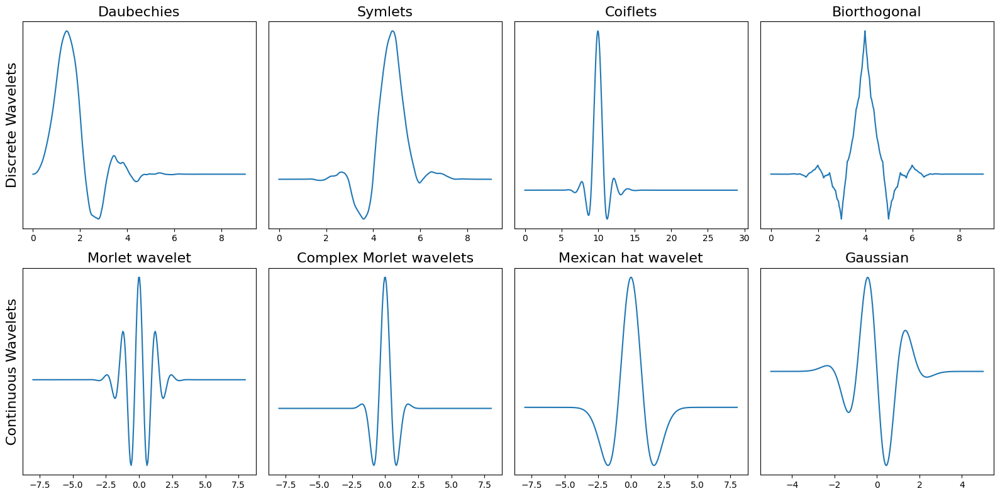

In [158]:
discrete_wavelets = ['db5', 'sym5', 'coif5', 'bior2.4']
continuous_wavelets = [ 'morl', 'cmor', 'mexh', 'gaus5']

list_list_wavelets = [discrete_wavelets, continuous_wavelets]
list_funcs = [pywt.Wavelet, pywt.ContinuousWavelet]

fig, axarr = plt.subplots(nrows=2, ncols=4, figsize=(16,8))
for ii, list_wavelets in enumerate(list_list_wavelets):
    func = list_funcs[ii]
    row_no = ii
    for col_no, waveletname in enumerate(list_wavelets):
        wavelet = func(waveletname)
        family_name = wavelet.family_name
        biorthogonal = wavelet.biorthogonal
        orthogonal = wavelet.orthogonal
        symmetry = wavelet.symmetry
        if ii == 0:
            _ = wavelet.wavefun()
            wavelet_function = _[0]
            x_values = _[-1]
        else:
            wavelet_function, x_values = wavelet.wavefun()
        if col_no == 0 and ii == 0:
            axarr[row_no, col_no].set_ylabel("Discrete Wavelets", fontsize=16)
        if col_no == 0 and ii == 1:
            axarr[row_no, col_no].set_ylabel("Continuous Wavelets", fontsize=16)
        axarr[row_no, col_no].set_title("{}".format(family_name), fontsize=16)
        axarr[row_no, col_no].plot(x_values, wavelet_function)
        axarr[row_no, col_no].set_yticks([])
        axarr[row_no, col_no].set_yticklabels([])

plt.tight_layout()
plt.show()

In [ ]:

plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()